# Adding XRF
In this chapter we will first set up an XRF object and then combine it with the MSI data

In [1]:
from user_params import copy_checkpoint
copy_checkpoint(5)

copied C:\Users\Yannick Zander\Downloads\maspim workshop\checkpoints\full example\SampleImageHandlerMSI.pickle to C:\Users\Yannick Zander\Downloads\maspim workshop\data\full example\SampleImageHandlerMSI.pickle
copied C:\Users\Yannick Zander\Downloads\maspim workshop\checkpoints\full example\ImageSample.pickle to C:\Users\Yannick Zander\Downloads\maspim workshop\data\full example\ImageSample.pickle
copied C:\Users\Yannick Zander\Downloads\maspim workshop\checkpoints\full example\ImageROI.pickle to C:\Users\Yannick Zander\Downloads\maspim workshop\data\full example\ImageROI.pickle
copied C:\Users\Yannick Zander\Downloads\maspim workshop\checkpoints\full example\ImageClassified.pickle to C:\Users\Yannick Zander\Downloads\maspim workshop\data\full example\ImageClassified.pickle


In [2]:
%matplotlib inline

from maspim import get_project
import user_params

path_folder = user_params.path_xrf_data

project_xrf = get_project(is_MSI=False, path_folder=path_folder)

C:\Users\Yannick Zander\Downloads\WPy64-31241\python-3.12.4.amd64\Lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated
  "class": algorithms.Blowfish,
did not find any file in [] with file_types=['bcf']


## Set the data object

In [3]:
project_xrf.require_data_object()

# if you feel confident with the syntax, try adding the hole classification 
# by uncommenting the lines below and filling in the gaps
# and see what happens in the cell below if you set exclude_holes to True
# project_xrf.require_image_...()
# project_xrf.require_image_...()
# project_xrf.require_image_...()
# project_xrf.add_p...()
# project_xrf.add_h...()

path_folder: C:\Users\Yannick Zander\Downloads\maspim workshop\data\S0343c XRF
measurement_name: S0343c
prefix_files: PS343 ctss 
_feature_table: Pandas DataFrame with columns [Al, Br, Ca, Cl, Fe, K, Mg, Mn, Na, Rb, ...], indices [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, ...] and shape (287280, 20)

did not find the column valid in the feature table classifying the holes, so not excluding pixels


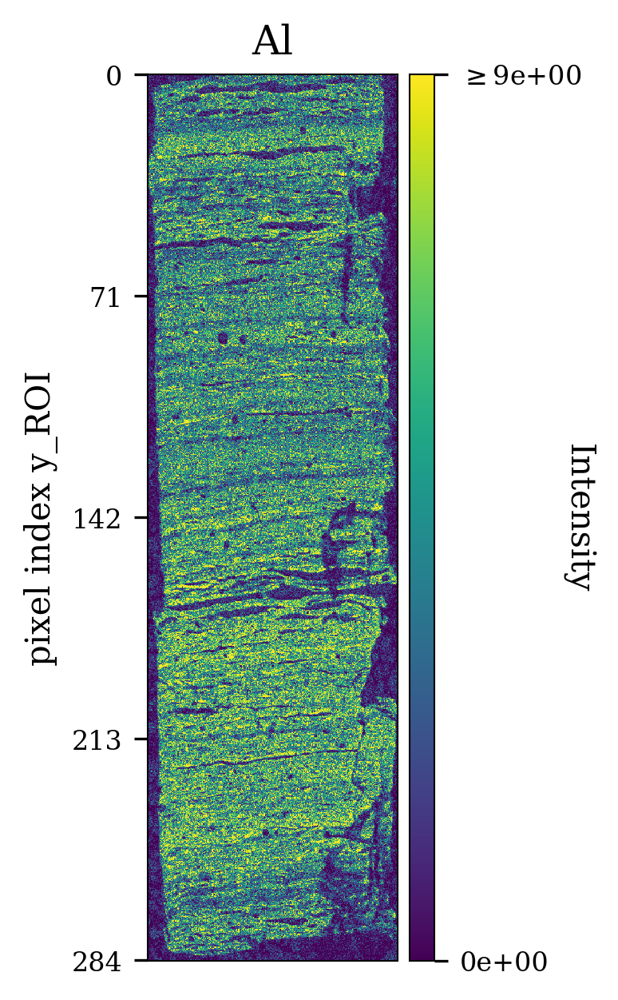

In [4]:
project_xrf.plot_comp('Al', flip=True, exclude_holes=False, classification_column='valid')

### Quiz
By changing the plotted element above to 'Si' and 'L' try to answer this question: Why is it dangerous to use Si?

In [5]:
from tasks import chapter5_task1

chapter5_task1.options()
chapter5_task1.ask()

The following options are available (you can enter the number of the answer):
(1) It is everywhere, so it doesn't tell us anything
(2) It has high abundances in holes
(3) It is noisy


## Set images
### ImageHandler
For XRF measurements the measurement area is determined by matching the Video channel in scale and position to the photo. The green outline shows the determined area. If you navigate to the XRF folder and open the file PS343c 490-495cm Mosaic.bmp you will see a faint green outline that matches the one determined here, so we managed to find the right area. 

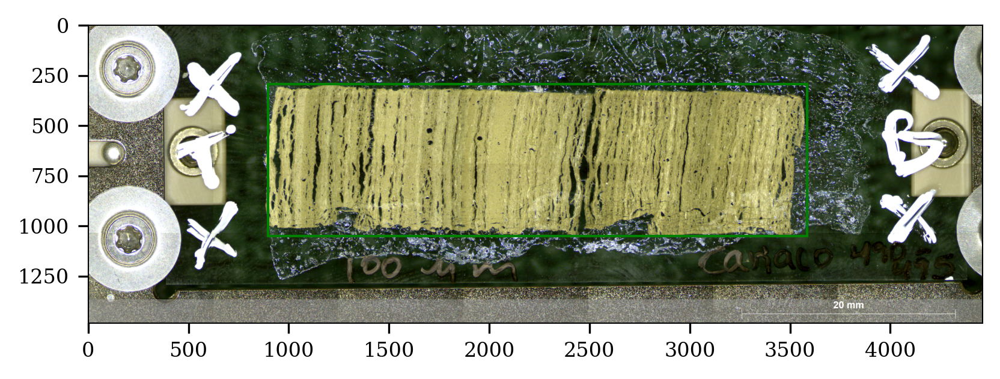

In [6]:
project_xrf.require_image_handler()
project_xrf.image_handler.plot_overview()

### ImageSample, ImageROI and ImageClassified
There is not much to be added from what we saw in chapter 4, this is the same for the XRF measurement

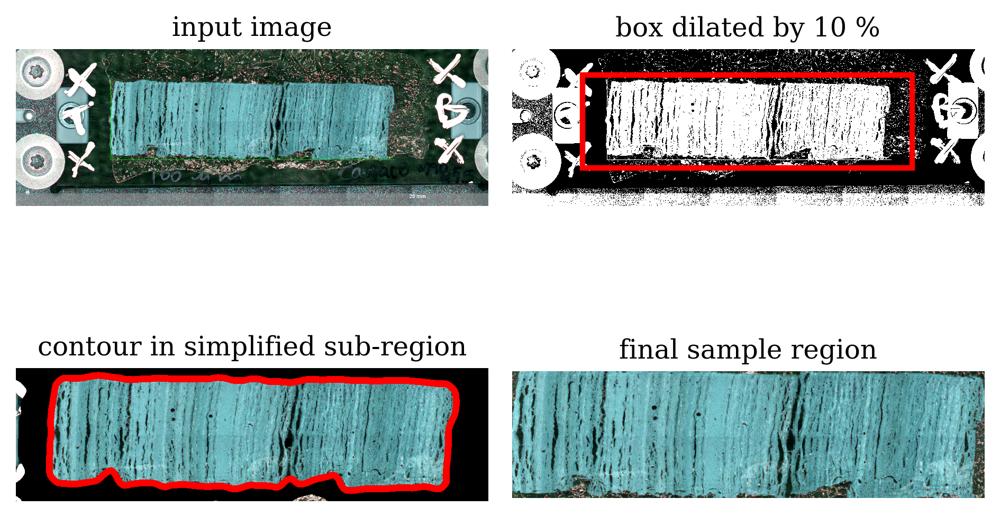

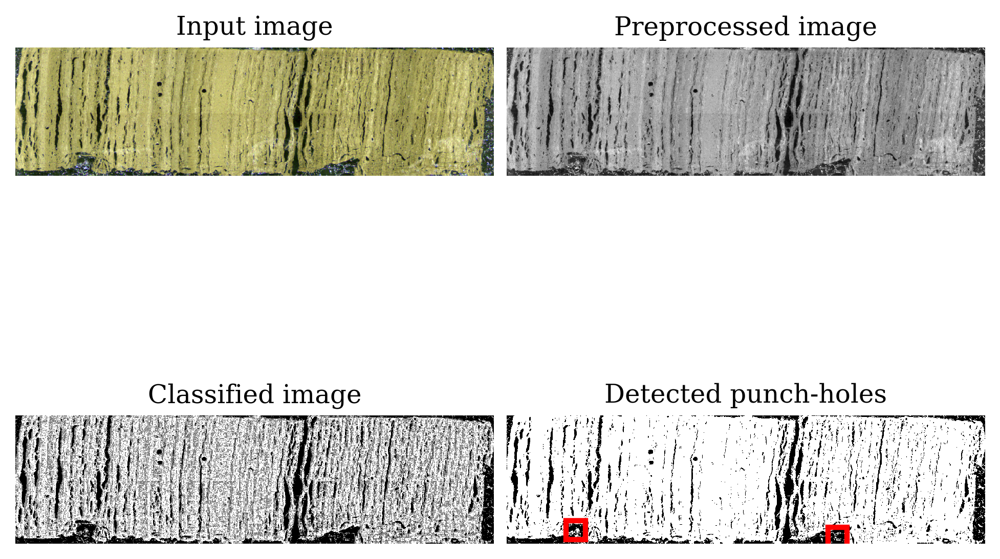

In [7]:
project_xrf.require_image_sample()
project_xrf.image_sample.plot_overview()
project_xrf.add_pixels_ROI()

project_xrf.require_image_roi()
project_xrf.image_roi.plot_overview()

### Quiz
Which of the following is true?

In [8]:
from tasks import chapter5_task2

chapter5_task2.options()
chapter5_task2.ask()

The following options are available (you can enter the number of the answer):
(1) The punch hole identification is more difficult in this image because the holes are closer to the boundary of the image
(2) The punch hole detection is easier because the holes are more square shaped
(3) The algorithm does not care about hard and easy, it simply picks the pixels with the highest scores


In [9]:
import math
project_xrf.age_span = (0, 100)
project_xrf.require_image_classified()
project_xrf.require_tilt_corrector(angles_min=math.radians(-22.5), 
                               angles_max=math.radians(22.5), 
                               plts=True, 
                               overwrite=False, 
                               ny_cells=5)

Loaded ImageClassified is expected to have a params table but found none
did not find any file in [] with file_types=['bcf']


_image_shape: [719, 2674]
_Us: [[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]]
_Vs: [[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]]
path_folder: C:\Users\Yannick Zander\Downloads\maspim workshop\data\S0343c XRF
_tag: tilt_correction

## Combine MSI and XRF
Now for the grand finale, let's combine the projects by adding the XRF images to the MSI ones

In [10]:
project_msi = get_project(is_MSI=True, path_folder=user_params.path_folder_real_data)
project_msi.require_images()  # convinience method that can be used when the images have been defined before
_ = project_msi.require_data_object(tag='with_images')

did not find tilt correction for self in set_combine_mapper, using default parameters to set Mapper.
setting unique values: 100%|█████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 37.66it/s]


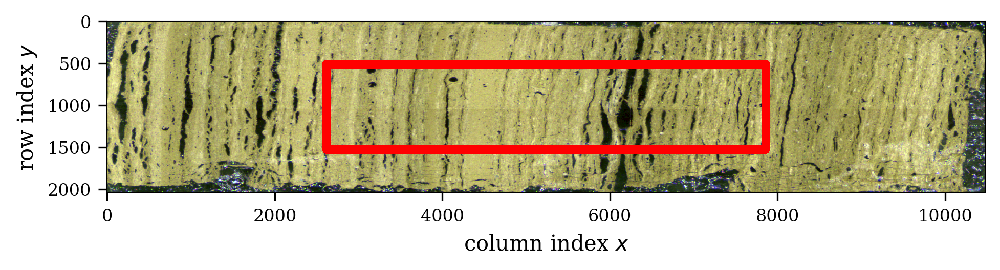

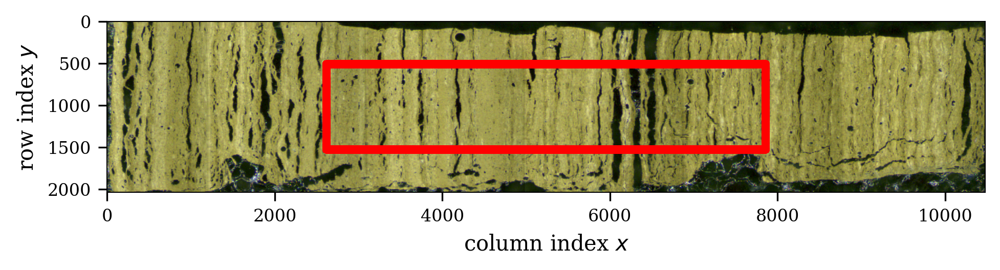

Found duplicate widths, reducing to unique widths
setting deformation field from streamlines: 100%|█████████████████████████████████| 100/100 [00:00<00:00, 13562.39it/s]


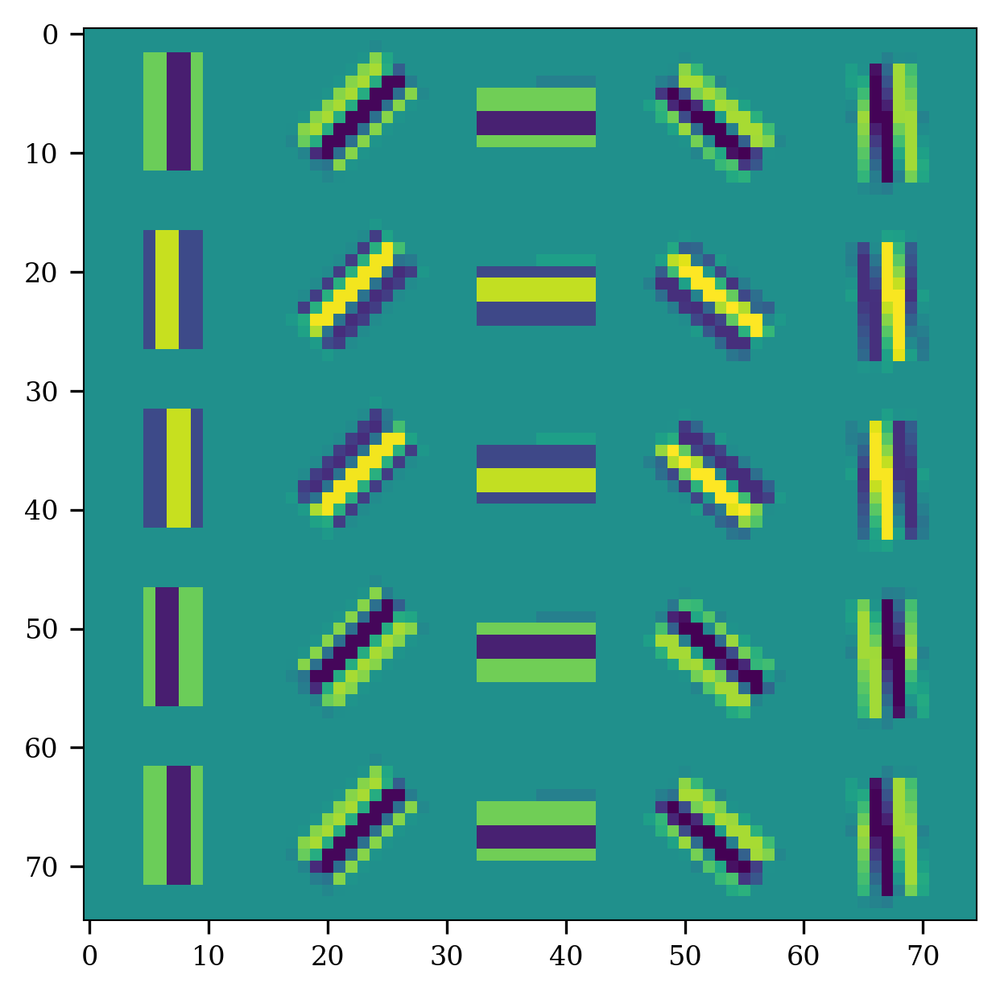

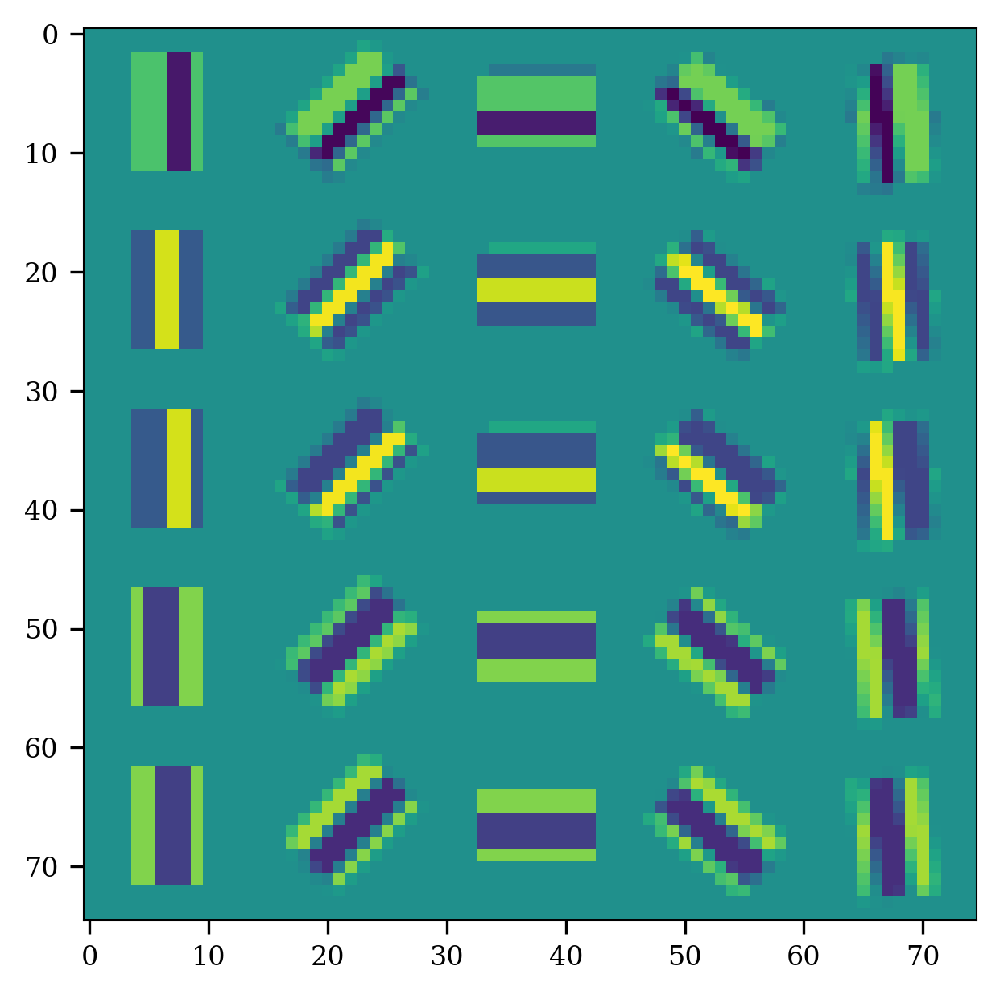

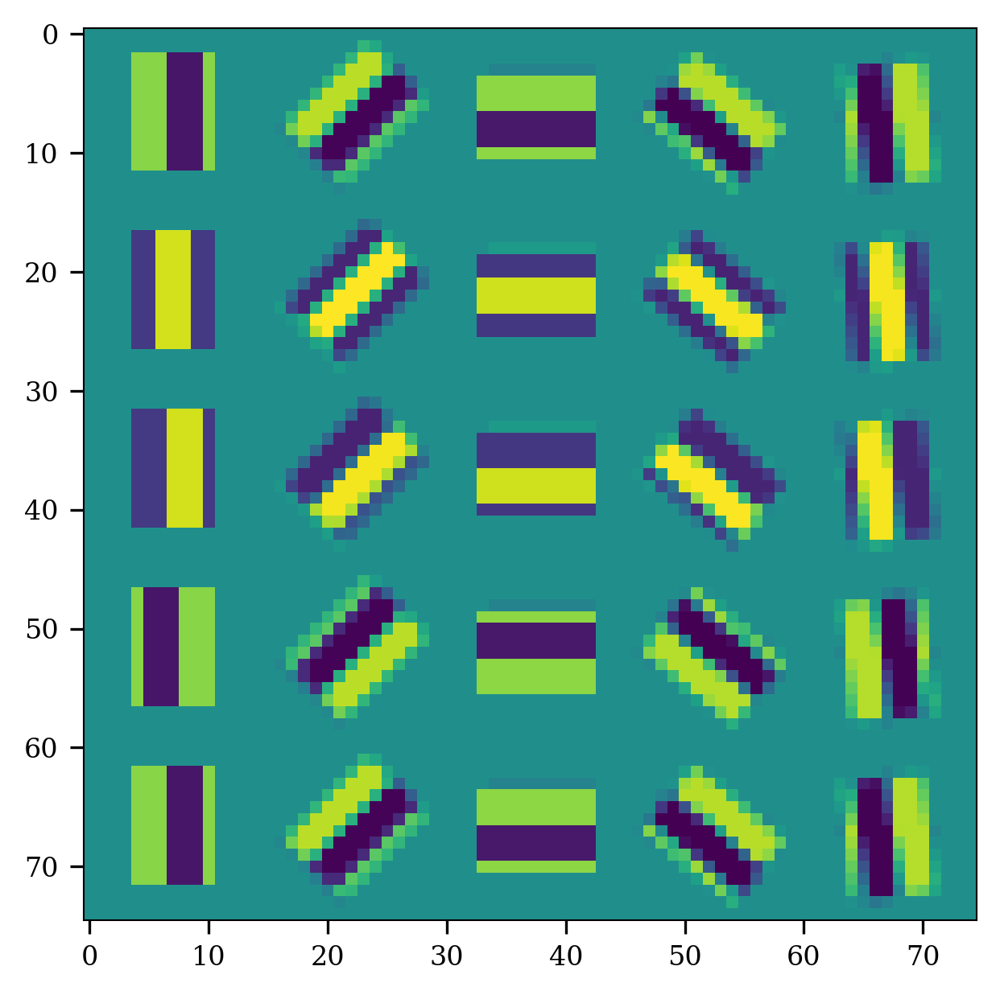

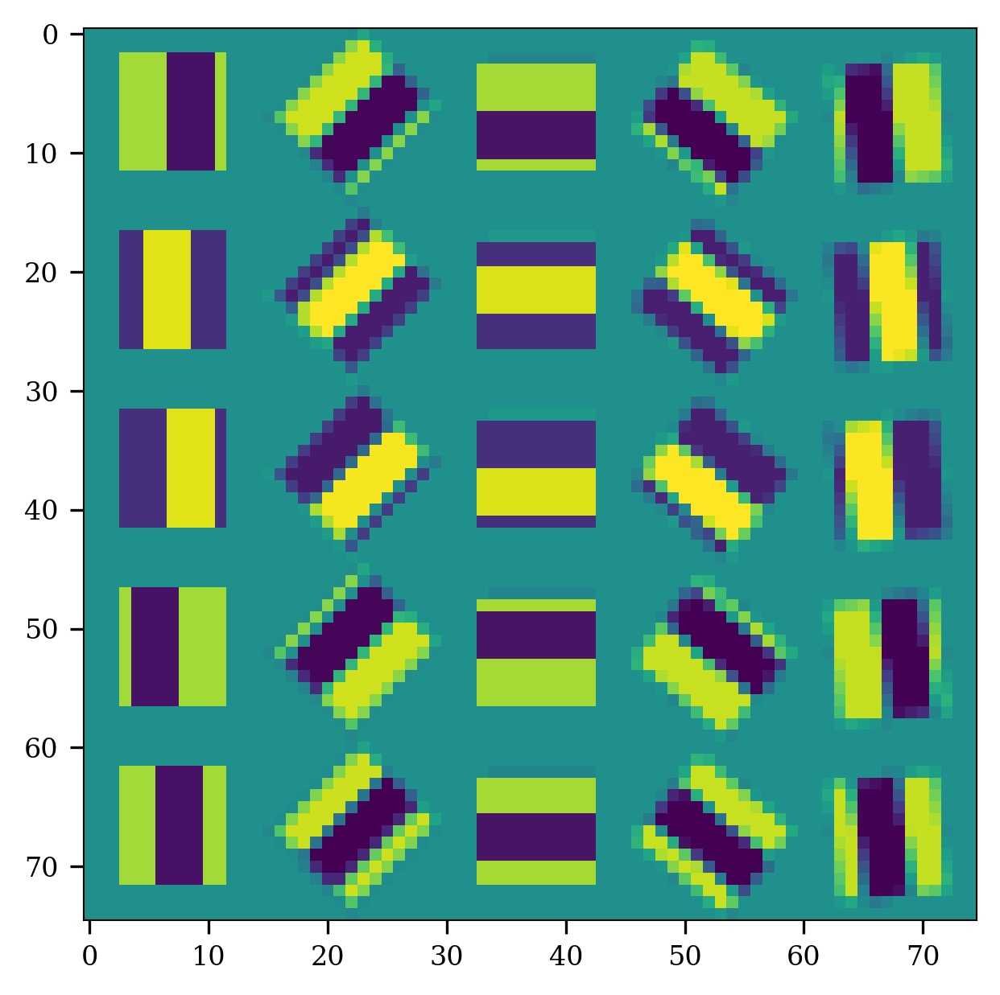

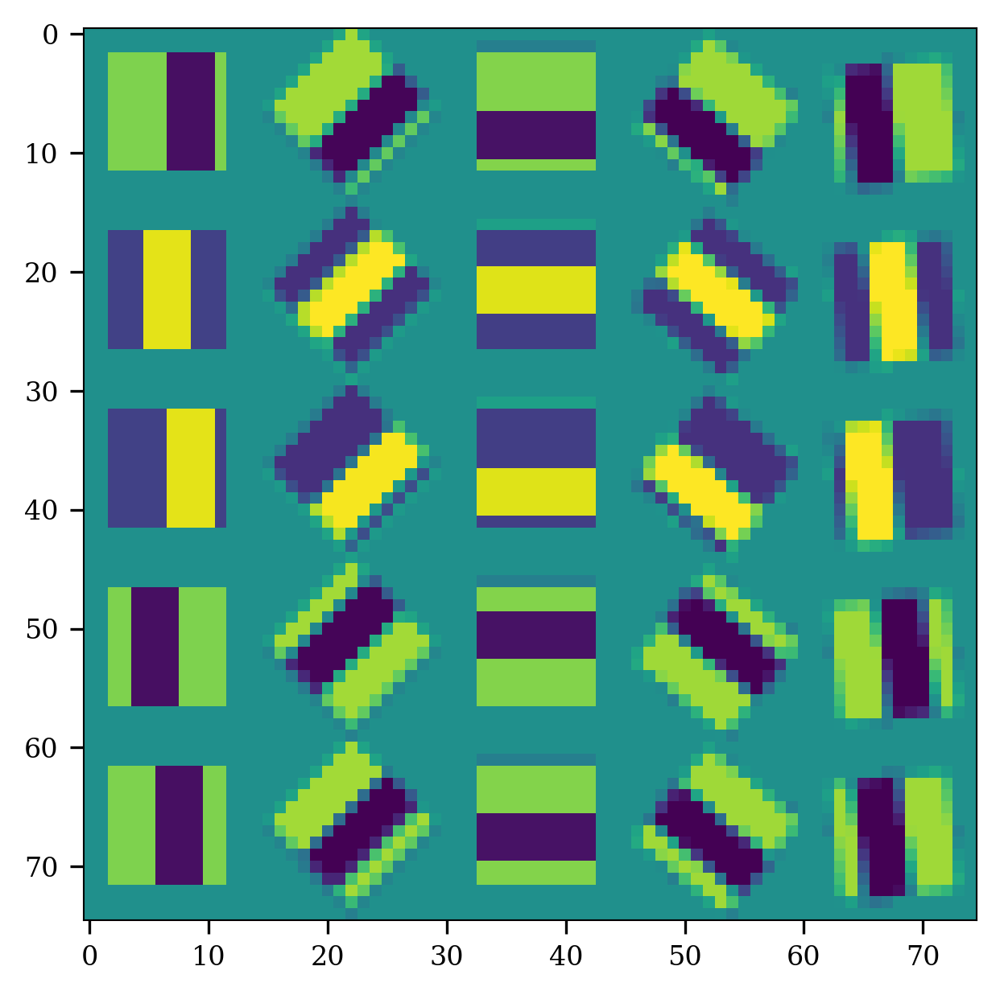

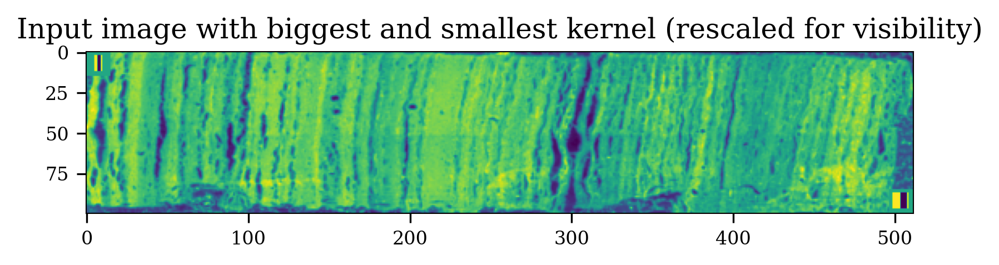

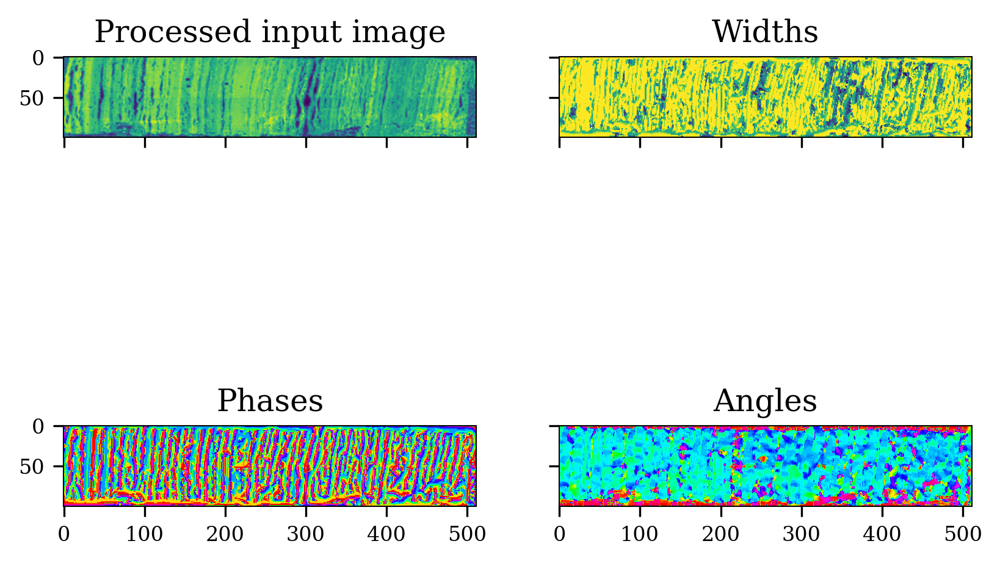

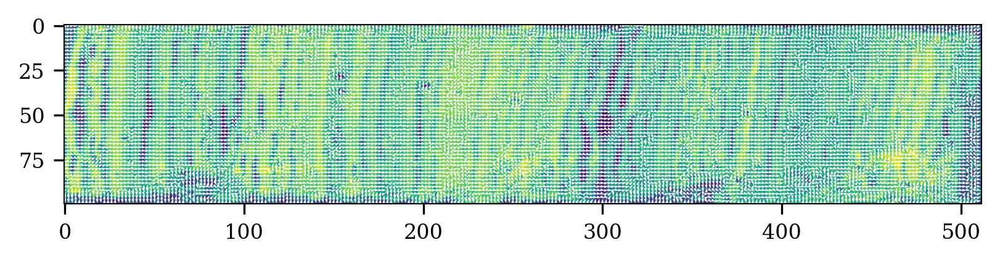

C:\Users\Yannick Zander\Downloads\WPy64-31241\python-3.12.4.amd64\Lib\site-packages\maspim\imaging\register\transformation.py:1249: RuntimeWarning: invalid value encountered in divide
  u_ = u[::step, ::step] / norm[::step, ::step]
C:\Users\Yannick Zander\Downloads\WPy64-31241\python-3.12.4.amd64\Lib\site-packages\maspim\imaging\register\transformation.py:1250: RuntimeWarning: invalid value encountered in divide
  v_ = v[::step, ::step] / norm[::step, ::step]


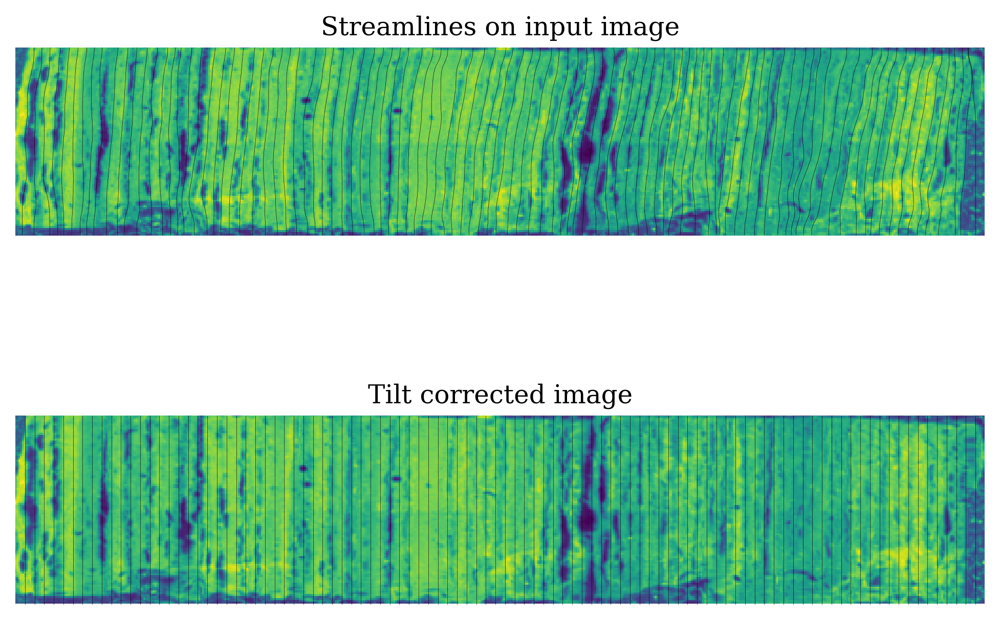

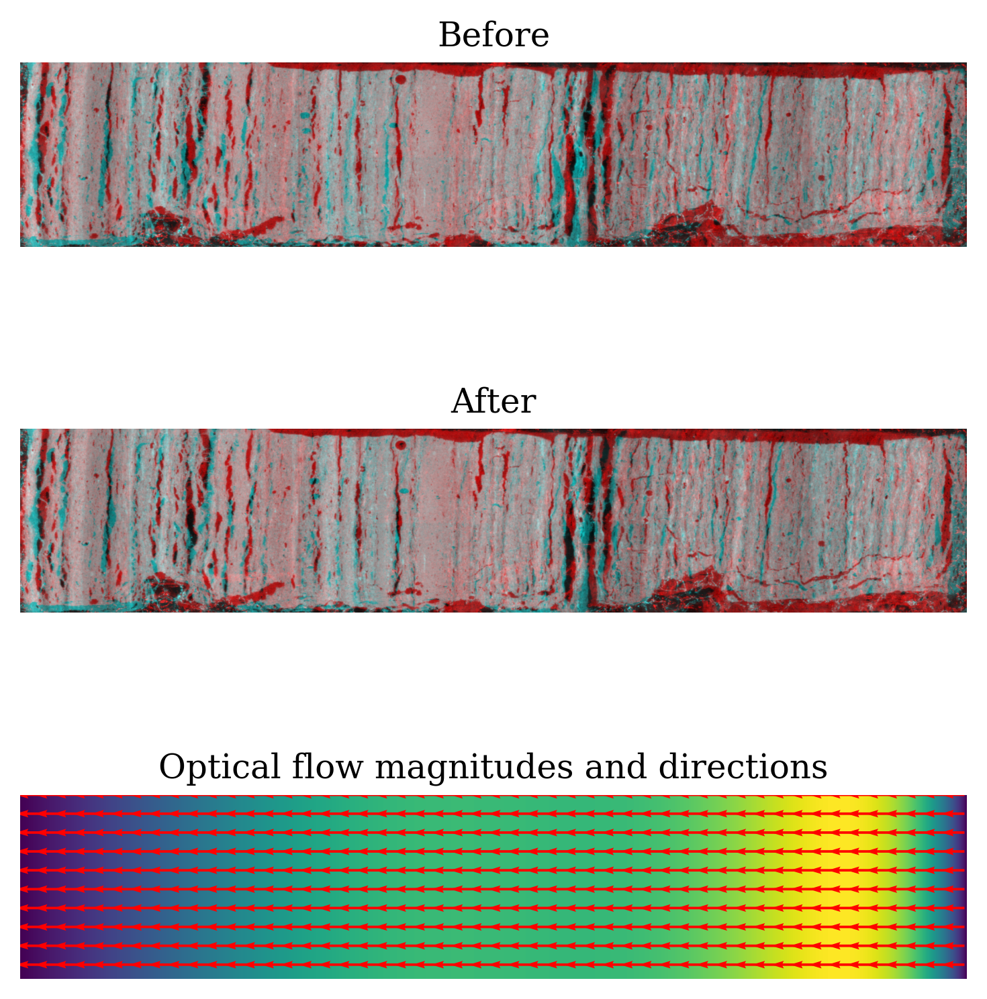

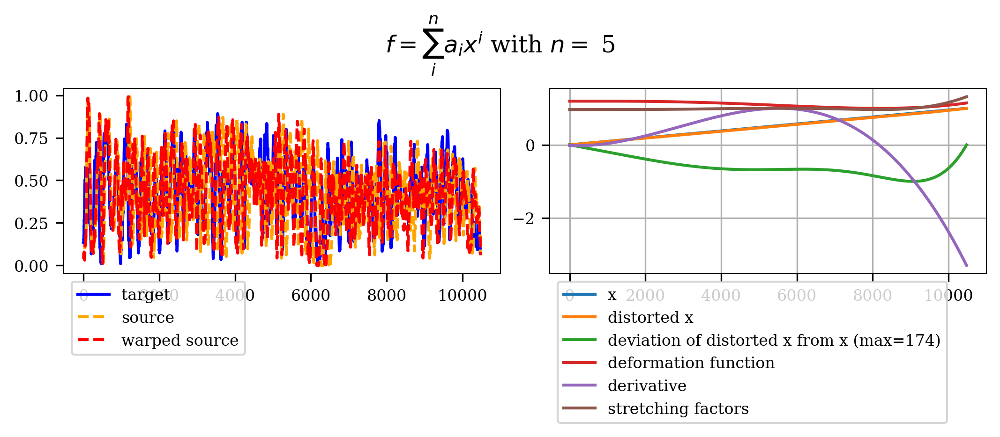

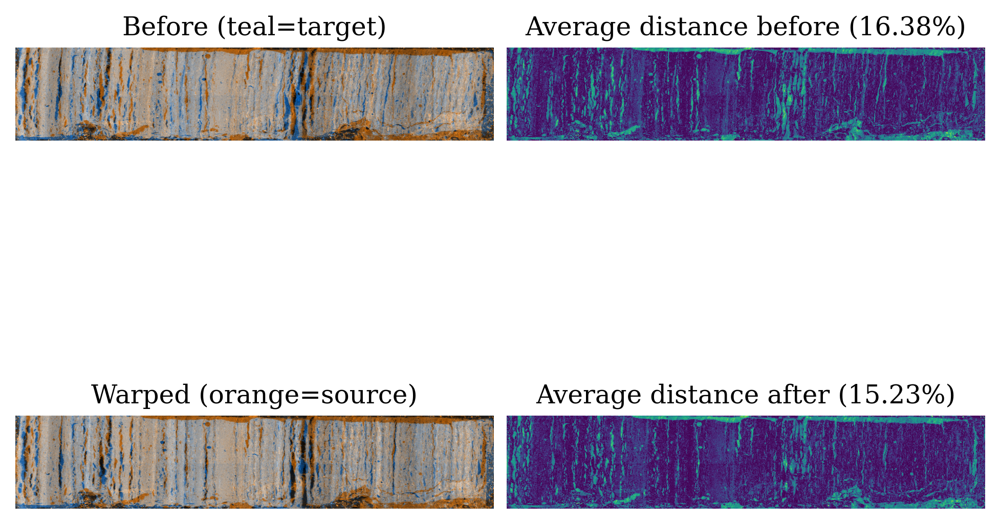

C:\Users\Yannick Zander\Downloads\WPy64-31241\python-3.12.4.amd64\Lib\site-packages\maspim\project\main.py:1619: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[    0.            11.75430067    19.59050112 ... 10496.59050112
 10508.3448018  10516.18100224]' has dtype incompatible with int32, please explicitly cast to a compatible dtype first.
  ft.loc[:, 'x_ROI'] = ft.loc[:, 'x_ROI'].astype(float) * rescale_x
C:\Users\Yannick Zander\Downloads\WPy64-31241\python-3.12.4.amd64\Lib\site-packages\maspim\project\main.py:1620: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[ -73.73296245  -73.73296245  -73.73296245 ... 2073.03059805 2073.03059805
 2073.03059805]' has dtype incompatible with int32, please explicitly cast to a compatible dtype first.
  ft.loc[:, 'y_ROI'] = ft.loc[:, 'y_ROI'].astype(float) * rescale_y


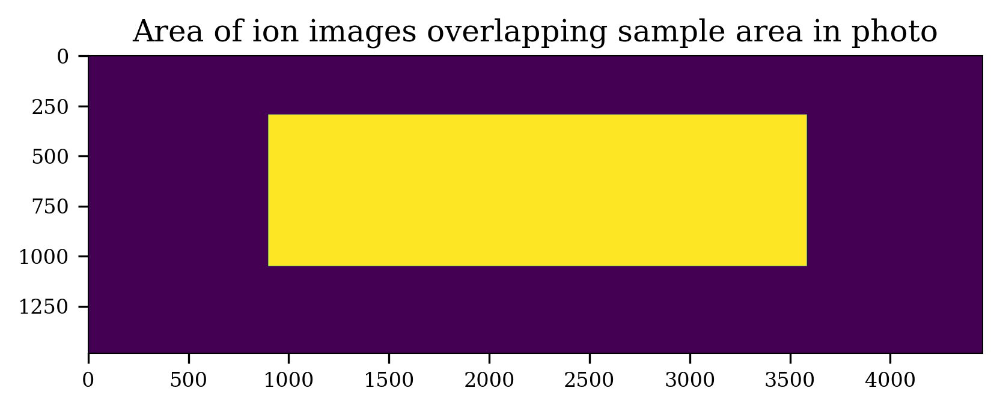

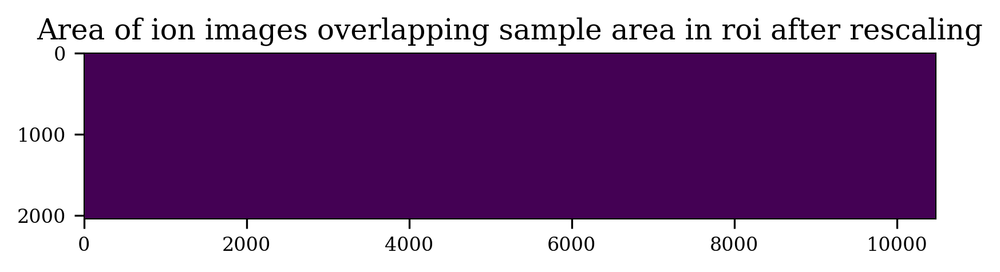

adding ion images: 100%|███████████████████████████████████████████████████████████████| 16/16 [02:49<00:00, 10.57s/it]


In [11]:
mapper_combine = project_msi.require_combine_mapper(project_xrf, plts=True, self_tilt_correction=True, other_tilt_correction=True)
project_xrf.data_object_apply_transformation(mapper=mapper_combine, plts=True)

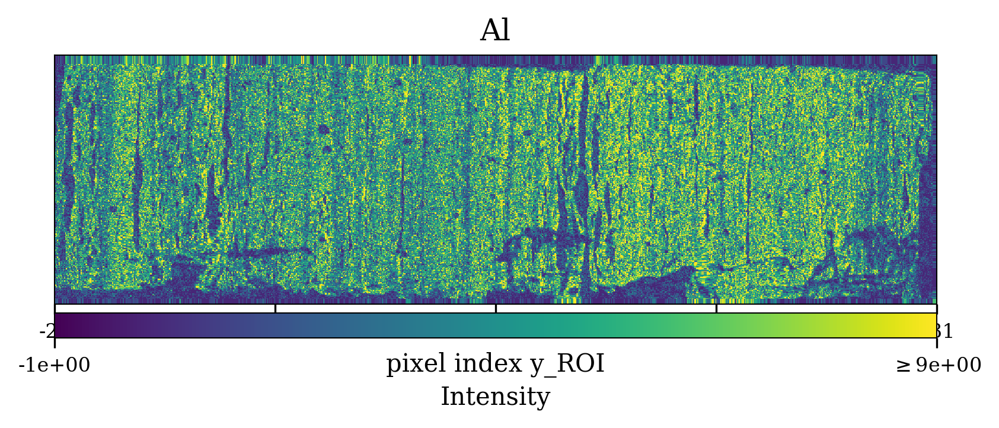

In [12]:
project_xrf.plot_comp('Al')

Above, you can see a lot of figures that show how the algorithm is mapping the images on top of each other: 
* Firstly, both the MSI and XRF images are transformed according to the tilt correction
* Next the bounding boxes (red rectangles in the first two images, scaled down to fit on the image) are matched. In this case, the two regions are quite similar, to begin with, so there will not be a big difference but this would take care of any rotated samples or if their aspect ratios differ
* The other figures show the result of trying to match laminae by stretching along the horizontal axis.